In [ ]:
from avcv.all import *

In [ ]:
cc = DiagnoseCoco('/data/DMS_Behavior_Detection/Action_Eating_frames/annotations/instances_default.json')

In [ ]:
def get_video_name(img_or_img_name):
    if isinstance(img_or_img_name, dict):
        return get_video_name(img_or_img_name['file_name'])
    vname = img['file_name'].split('/')[-2]
    return vname

label_by_videos = {img['file_name'].split('/')[-2]:0 for img in cc.gt.imgs.values()}
img_ids_by_video = {}
for img in cc.gt.imgs.values():
    vname = get_video_name(img)
    if not vname in img_ids_by_video: img_ids_by_video[vname] = []
    img_ids_by_video[vname].append(img['id'])

In [ ]:
# img_ids_by_video

In [ ]:
for ann in cc.gt.anns.values():
    img = cc.gt.imgs[ann['image_id']]
    video_name = img['file_name'].split('/')[-2]
    label_by_videos[video_name] += 1
    img_ids_by_video[video_name].append(img['id'])

In [ ]:
# label_by_videos

In [ ]:
# df = pd.DataFrame.from_dict(label_by_videos, orient='index', columns=['count']).sort_values('count')

In [ ]:
# df[(df['count']==0)]

In [ ]:
# cc.visualize(1151, show=1);

In [ ]:
# img_ids_by_video['hoangnh42_Sensing_Session0_CAMc_1b_2b_3a_4c_5b_6b_7b_8a_9a_10b_11b_12b_13b_14a_15b_16f_17a_18a_19a_20b_eating_0009']

In [ ]:
# use_video_names = set(df[df['count']>0].index)

In [ ]:
from avcv.coco import split_coco

In [ ]:
split_coco??

Signature: split_coco(coco, train_ratio=0.85, seed=0)
Docstring: <no docstring>
Source:   
def split_coco(coco, train_ratio=0.85, seed=0):
    if isinstance(coco, dict):
        coco = AvCOCO(coco)
    ids = list(coco.imgs.keys())
    np.random.seed(seed)
    np.random.shuffle(ids)
    train_n = int(len(ids)*train_ratio)
    train_ids = ids[:train_n]
    test_ids = ids[train_n:]
    logger.info('Spliting ratio {} -> {} training and {} testing'.format(train_ratio, len(train_ids), len(test_ids)))
    
    # train_ds = coco.dataset.copy()
    # val_ds = coco.dataset.copy()
    def get_ds(ids):
        out = dict(categories=coco.dataset['categories'], images=[], annotations=[])
        for img_id in ids:
            out['images'].append(coco.imgs[img_id])
            out['annotations'].extend(coco.imgToAnns[img_id])
        return out
    return get_ds(train_ids), get_ds(test_ids)
File:      ~/avcv/avcv/coco.py
Type:      function


In [ ]:
# len(cc.img_ids)

In [ ]:
# vis = []

# for img_id in cc.img_ids[0::15]:
#     vis.append(cc.visualize(show=0, dpi=50, img_id=img_id));
#     if len(vis) == 16:
#         plot_images(vis, mxn=[4,4])
#         plt.show()
#         vis = []

In [ ]:
new_ds = cc.gt.dataset.copy()
new_ds['images'] = cc.gt.loadImgs(use_img_ids).copy()
new_ds['annotations'] = cc.gt.loadAnns(cc.gt.getAnnIds(imgIds=use_img_ids)).copy()

In [ ]:
new_cc = CocoDataset(new_ds, cc.img_dir)

2022-09-16 03:02:30.310 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2110


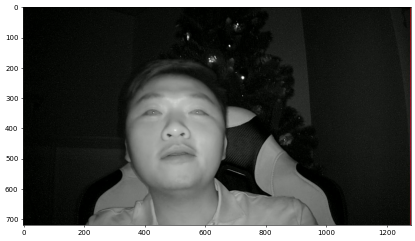

2022-09-16 03:02:30.564 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=528


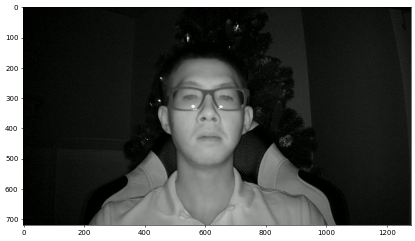

2022-09-16 03:02:30.830 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=449


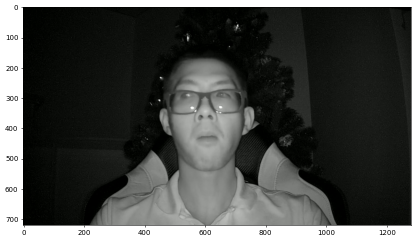

2022-09-16 03:02:31.086 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=462


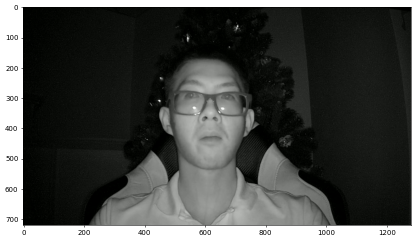

2022-09-16 03:02:31.337 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3815


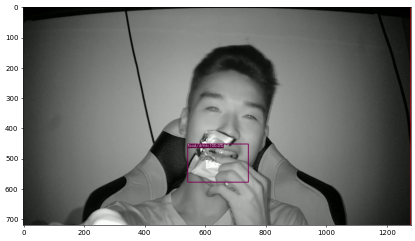

2022-09-16 03:02:31.577 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3005


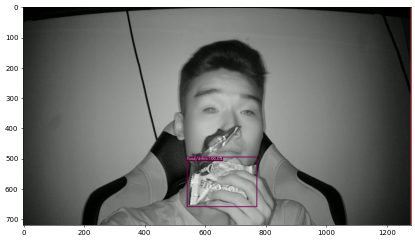

2022-09-16 03:02:31.830 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1832


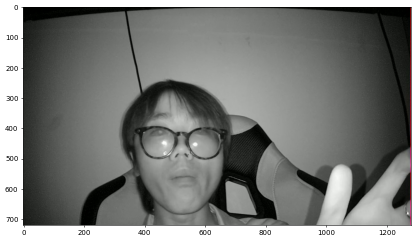

2022-09-16 03:02:32.082 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=612


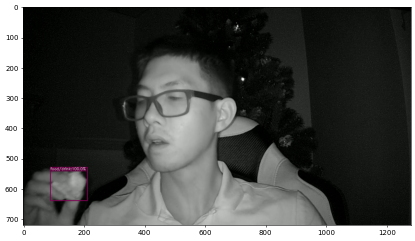

2022-09-16 03:02:32.336 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3661


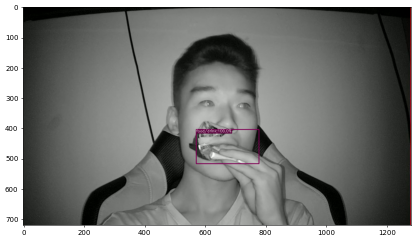

2022-09-16 03:02:32.575 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=591


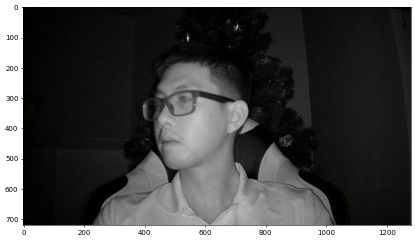

2022-09-16 03:02:32.823 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4423


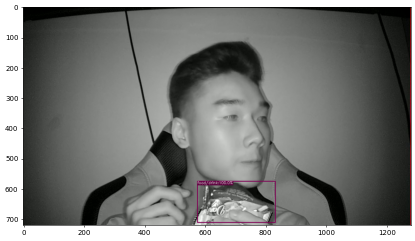

2022-09-16 03:02:33.052 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2208


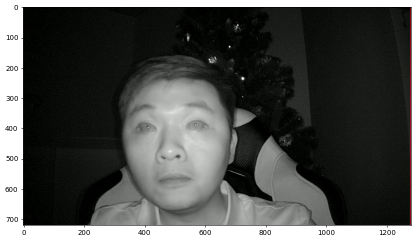

2022-09-16 03:02:33.308 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2129


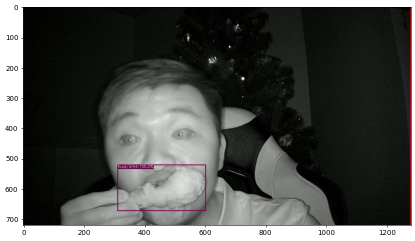

2022-09-16 03:02:33.567 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=657


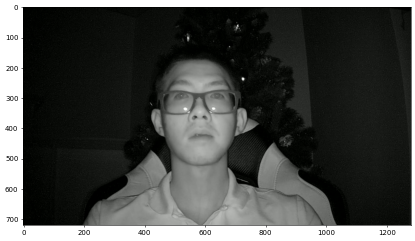

2022-09-16 03:02:33.822 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4341


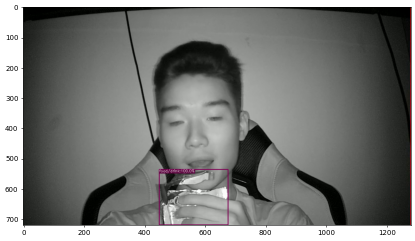

2022-09-16 03:02:34.087 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=49


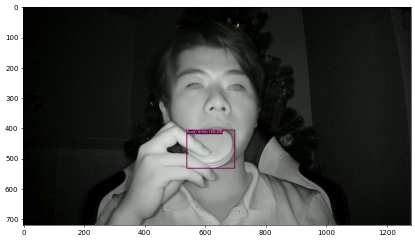

2022-09-16 03:02:34.348 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3514


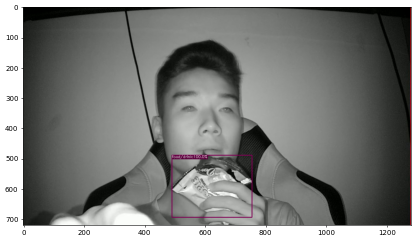

2022-09-16 03:02:34.605 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3051


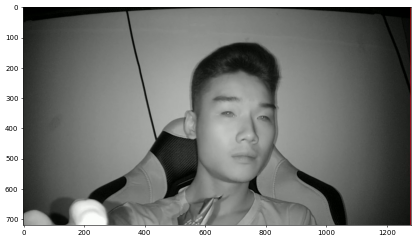

2022-09-16 03:02:34.868 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4065


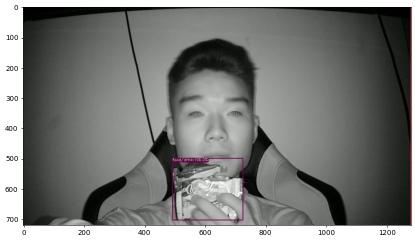

2022-09-16 03:02:35.120 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3530


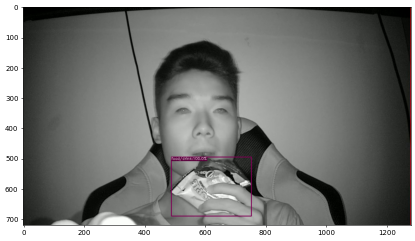

2022-09-16 03:02:35.397 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4590


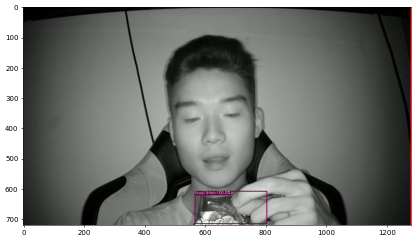

2022-09-16 03:02:35.652 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3702


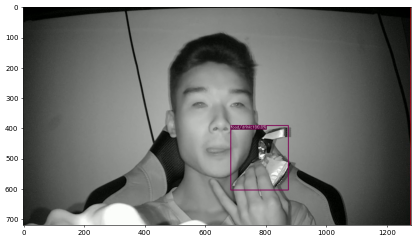

2022-09-16 03:02:35.922 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=434


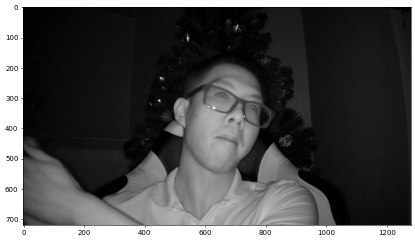

2022-09-16 03:02:36.204 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3337


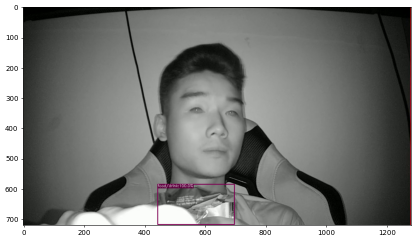

2022-09-16 03:02:36.453 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2669


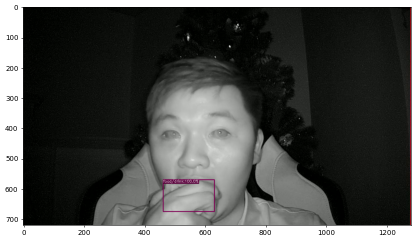

2022-09-16 03:02:36.704 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=504


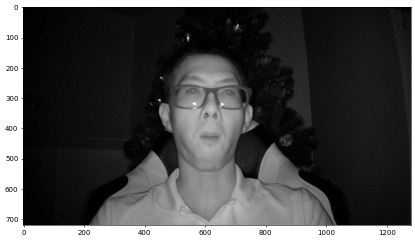

2022-09-16 03:02:36.951 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2786


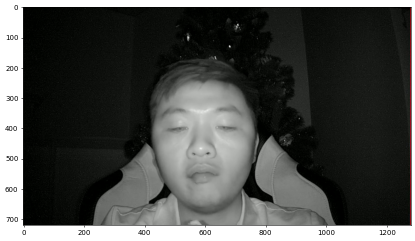

2022-09-16 03:02:37.199 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=766


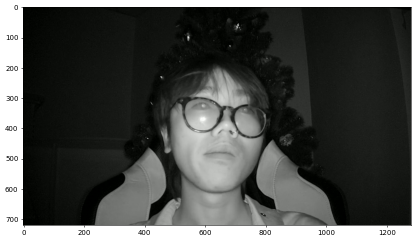

2022-09-16 03:02:37.444 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=667


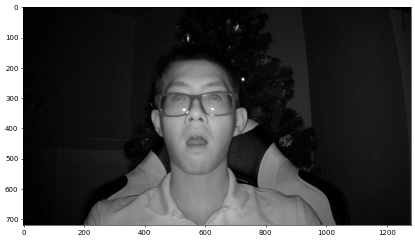

2022-09-16 03:02:37.690 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3206


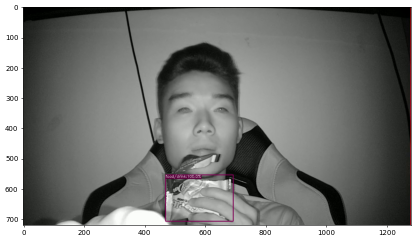

2022-09-16 03:02:37.942 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=433


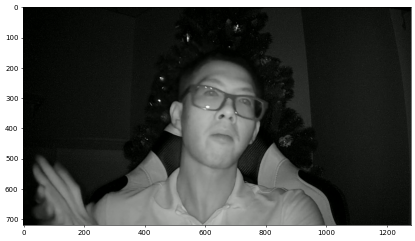

2022-09-16 03:02:38.210 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=613


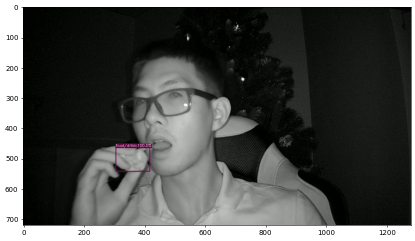

2022-09-16 03:02:38.469 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3201


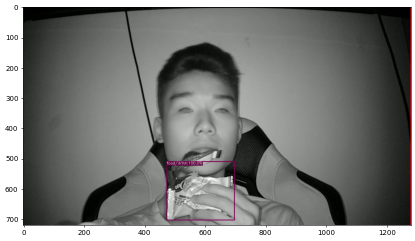

2022-09-16 03:02:38.722 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=711


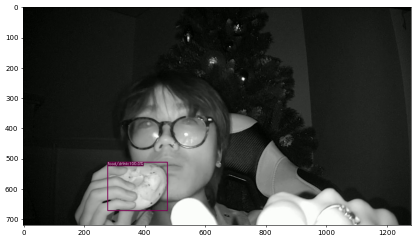

2022-09-16 03:02:38.971 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2326


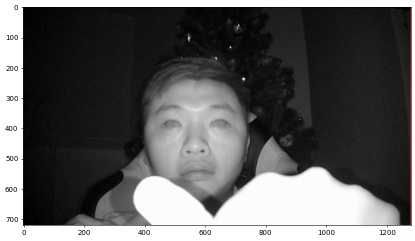

2022-09-16 03:02:39.228 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3878


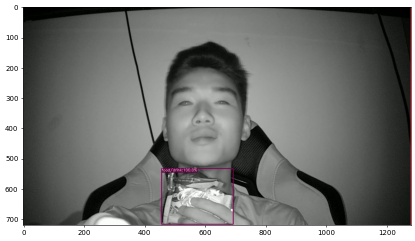

2022-09-16 03:02:39.484 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1019


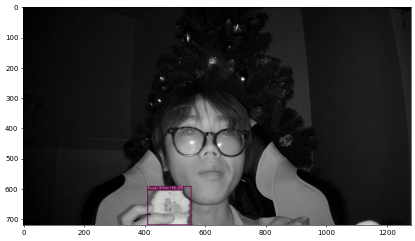

2022-09-16 03:02:39.734 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3370


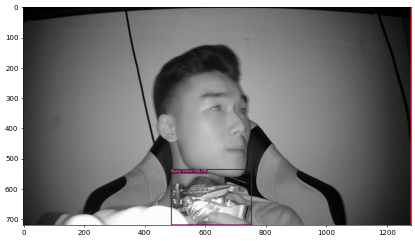

2022-09-16 03:02:39.973 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1772


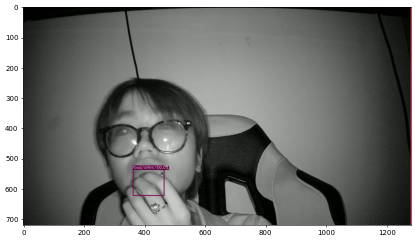

2022-09-16 03:02:40.235 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1347


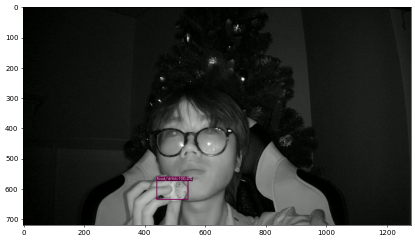

2022-09-16 03:02:40.494 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1879


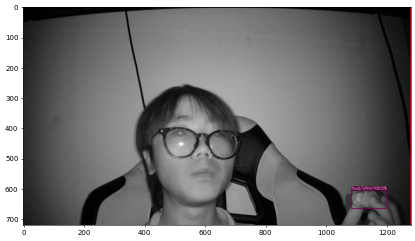

2022-09-16 03:02:40.744 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4069


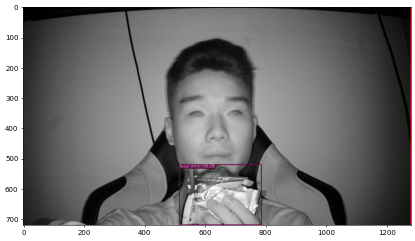

2022-09-16 03:02:41.637 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1109


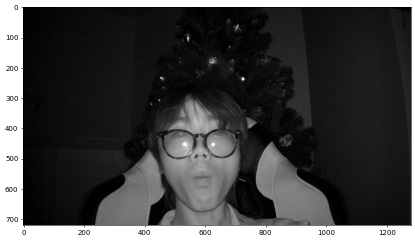

2022-09-16 03:02:41.887 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=353


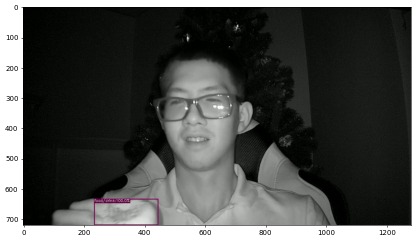

2022-09-16 03:02:42.148 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4507


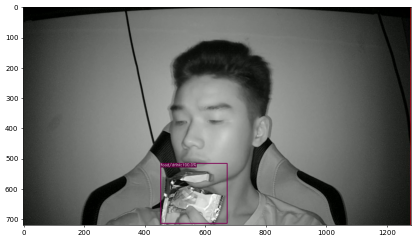

2022-09-16 03:02:42.428 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4425


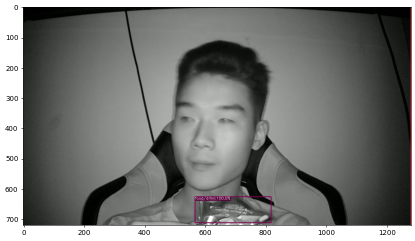

2022-09-16 03:02:42.677 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3357


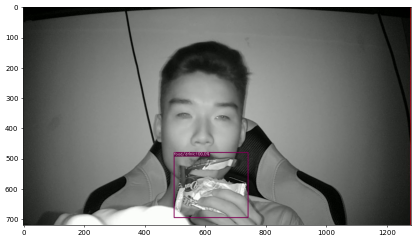

2022-09-16 03:02:42.953 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1944


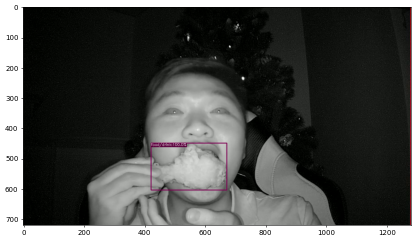

2022-09-16 03:02:43.234 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3025


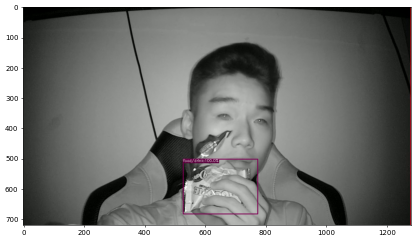

2022-09-16 03:02:43.498 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4304


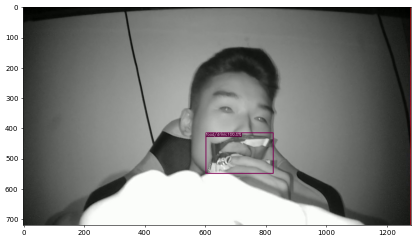

2022-09-16 03:02:43.744 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2984


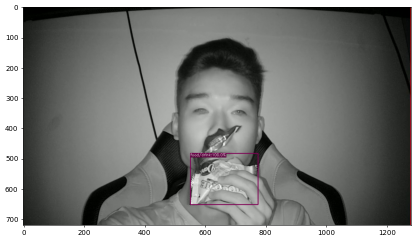

2022-09-16 03:02:44.002 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1880


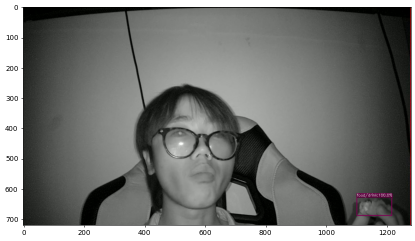

2022-09-16 03:02:44.272 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1315


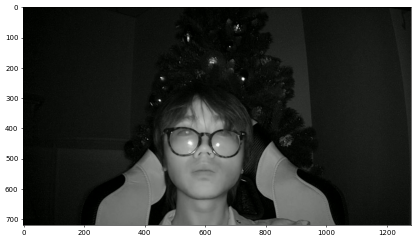

2022-09-16 03:02:44.535 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2478


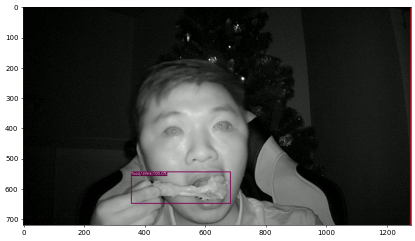

2022-09-16 03:02:44.826 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=220


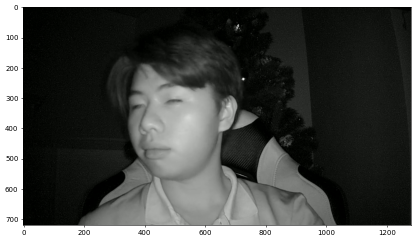

2022-09-16 03:02:45.118 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=188


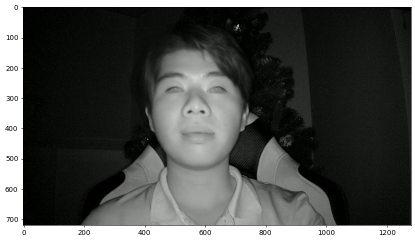

2022-09-16 03:02:45.382 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4588


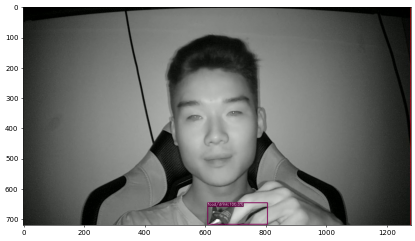

2022-09-16 03:02:45.627 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3817


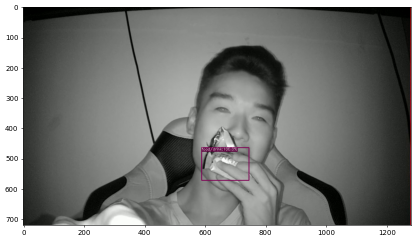

2022-09-16 03:02:45.878 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1862


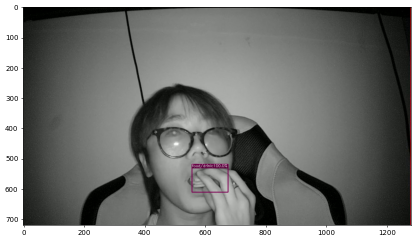

2022-09-16 03:02:46.119 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2568


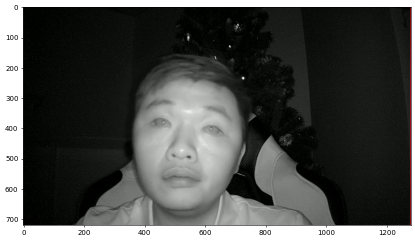

2022-09-16 03:02:46.387 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2707


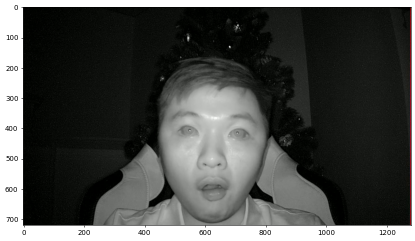

2022-09-16 03:02:46.664 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2019


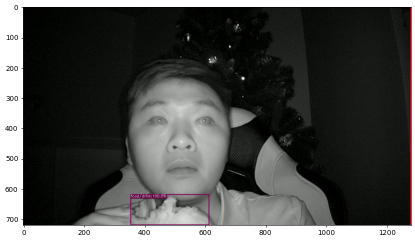

2022-09-16 03:02:46.922 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=456


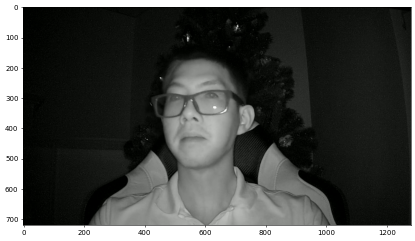

2022-09-16 03:02:47.190 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1454


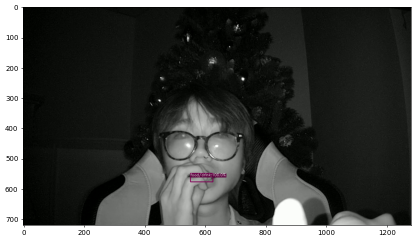

2022-09-16 03:02:47.440 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1703


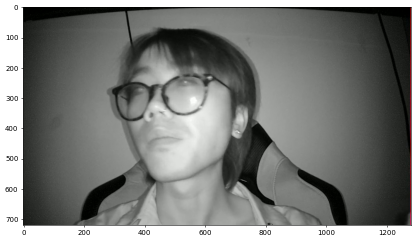

2022-09-16 03:02:47.679 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1047


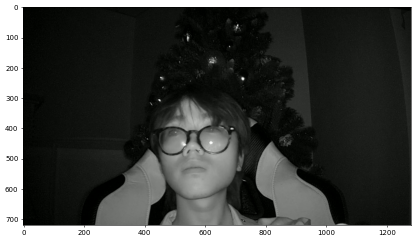

2022-09-16 03:02:47.929 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=586


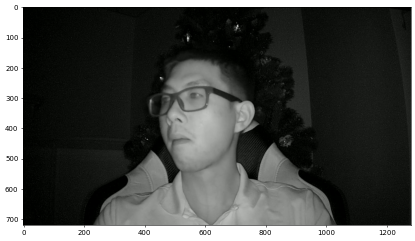

2022-09-16 03:02:48.179 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=541


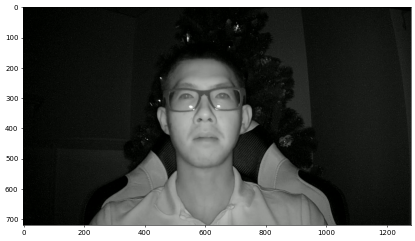

2022-09-16 03:02:48.425 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2981


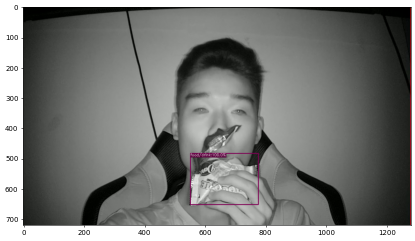

2022-09-16 03:02:48.671 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1101


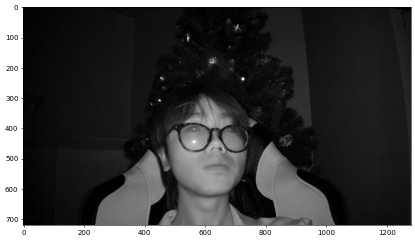

2022-09-16 03:02:48.920 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2668


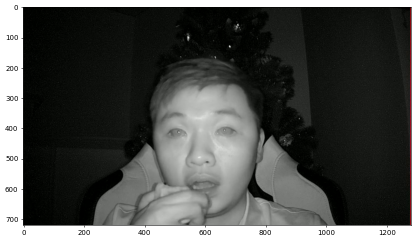

2022-09-16 03:02:49.183 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2574


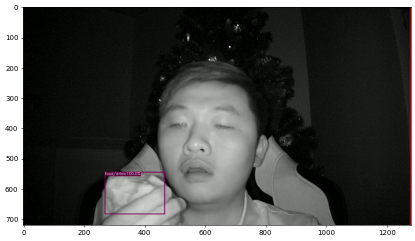

2022-09-16 03:02:49.441 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3236


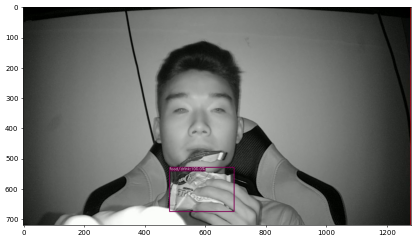

2022-09-16 03:02:49.679 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=631


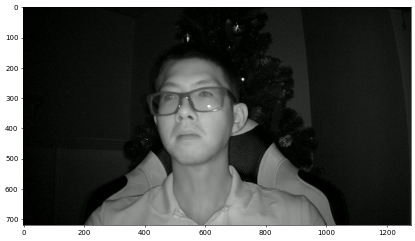

2022-09-16 03:02:49.924 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3309


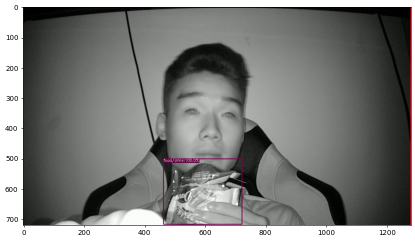

2022-09-16 03:02:50.180 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4442


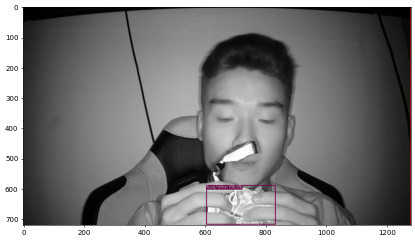

2022-09-16 03:02:50.435 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=287


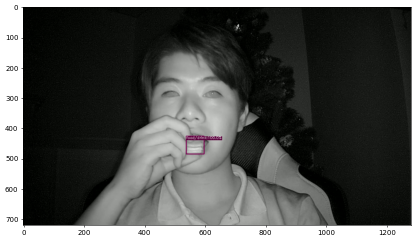

2022-09-16 03:02:50.688 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4484


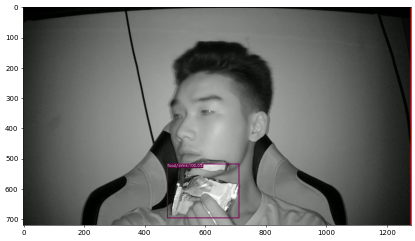

2022-09-16 03:02:50.946 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4162


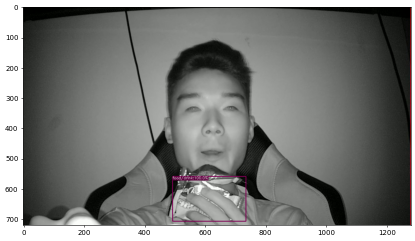

2022-09-16 03:02:51.203 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1465


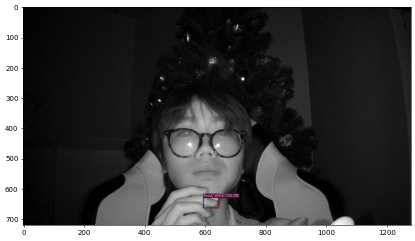

2022-09-16 03:02:51.472 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1666


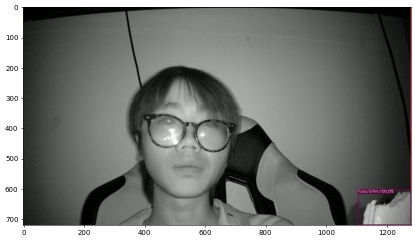

2022-09-16 03:02:51.735 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1564


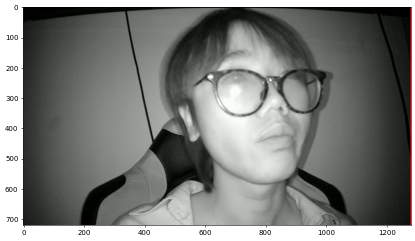

2022-09-16 03:02:52.010 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3205


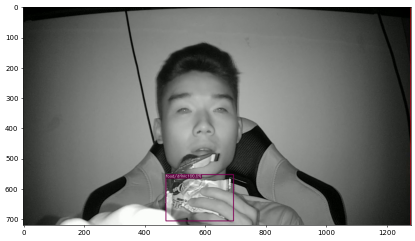

2022-09-16 03:02:52.271 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4536


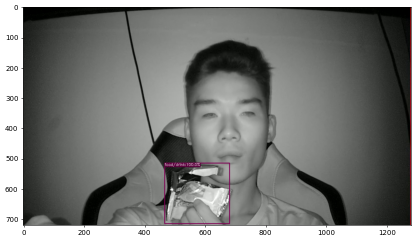

2022-09-16 03:02:52.535 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4286


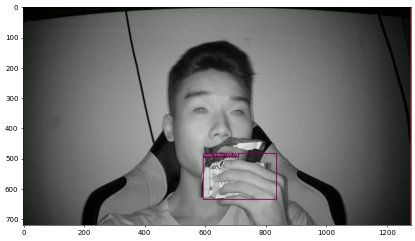

2022-09-16 03:02:52.788 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=529


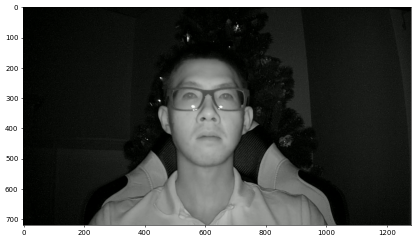

2022-09-16 03:02:53.037 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2495


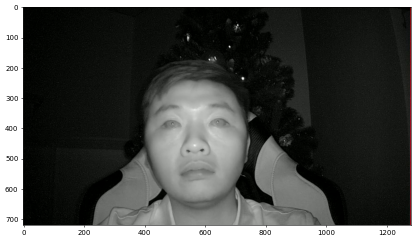

2022-09-16 03:02:53.312 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4290


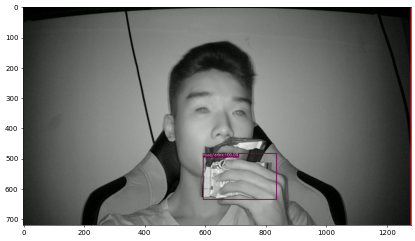

2022-09-16 03:02:53.572 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1153


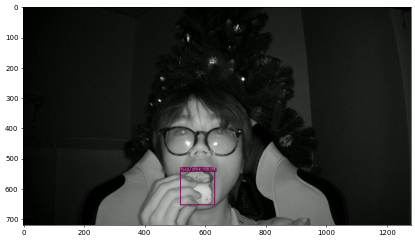

2022-09-16 03:02:53.836 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2191


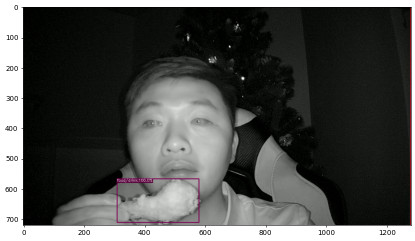

2022-09-16 03:02:54.087 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1122


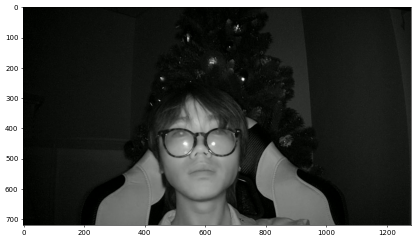

2022-09-16 03:02:54.356 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3688


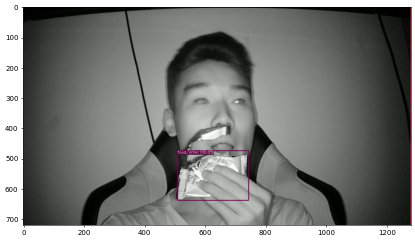

2022-09-16 03:02:54.619 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1106


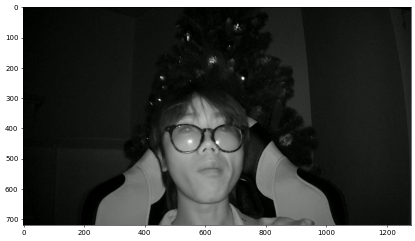

2022-09-16 03:02:54.867 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=992


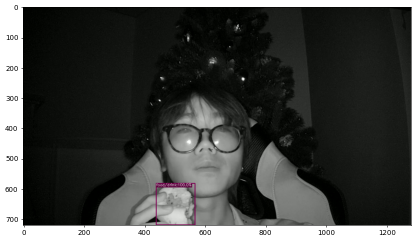

2022-09-16 03:02:55.135 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=646


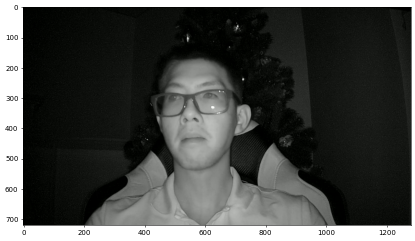

2022-09-16 03:02:55.394 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=1594


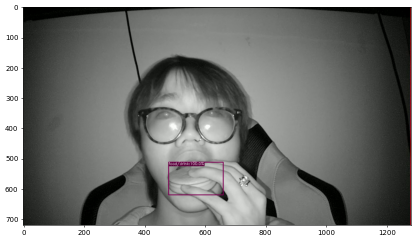

2022-09-16 03:02:55.649 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=3447


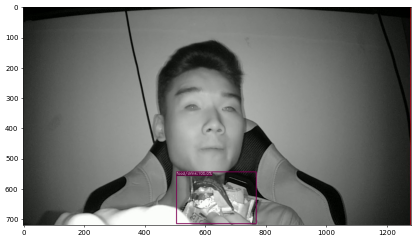

2022-09-16 03:02:55.895 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=445


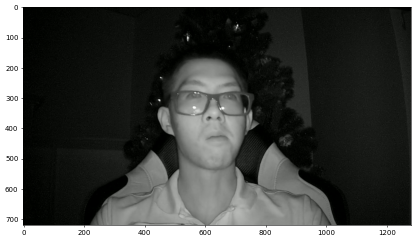

2022-09-16 03:02:56.143 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=2876


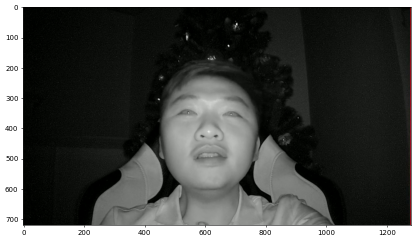

2022-09-16 03:02:56.412 | INFO     | avcv.coco:visualize:190 - Random visualize img_id=4589


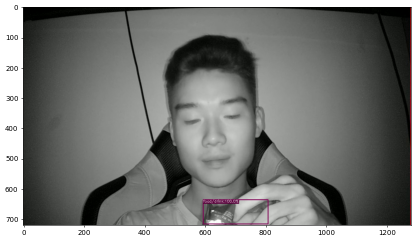

In [ ]:
for i in range(100):
    new_cc.visualize(show=1, dpi=50);

In [ ]:
# cc.gt.imgs[2961]

In [ ]:
# img_ids_by_video['tunm13_Sensing_Session0_CAMc_1b_2b_3a_4c_5b_6b_7b_8a_9a_10a_11b_12a_13a_14b_15b_16f_17a_18a_19a_20b_eating_0001']